# 精简板YOLO网络搭建训练与测试

In [25]:
from __future__ import absolute_import, division, print_function, unicode_literals
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from tensorflow.keras.layers import LeakyReLU
import tensorflow as tf
from tensorflow import keras
import cv2
import numpy as np
import winsound as ws
from time import sleep
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
print(tf.__version__)

2.1.0


In [2]:
ANNO_DIR=r"E:/New folder/CelebA/Img/my/"
ANNO_FILE=r"anno.txt"
ANNO_TEST_FILE=r"1030fix.txt"
IMG_DIR= r'E:/New folder/CelebA/Img/my/ori/'
NOISE_DIR=r'E:/New folder/CelebA/Img/my/noise_o/'
DEC_DIR=r'E:/New folder/CelebA/Img/my/dec/'
TEST_DIR=r'E:/New folder/CelebA/Img/my/test/'
MOD_DIR=r'E:\New folder\CelebA\Img\my\model'
SAVE_DIR=r'./'
SAVE_NAME=r'model.h5'
MOD_NAME='4134_1030LONG'

In [3]:
#训练集
STARTN=0 #起始图片（0~40000）
NUMBER=10000 #图片数量
#测试集
STARTN_T=240
NUMBER_T=100
#验证集
STARTN_v=1000
NUMBER_v=100
#网络输入设置
INPUT_H=240
INPUT_W=320
INPUT_C=3
#
THRESHOLD=0.6

### 定义损失函数

In [4]:
'''
原本的损失函数还包含没有物体时的边界盒损失，据论文说可以防止没有物体的单元格压制有物体单元格的梯度。
还有一部分时边界盒的置信度，没看懂是干啥的
这里我取消了这两部分，因为实在没搞懂到底啥意思，等搞懂了再加上。
'''
def loss_func(y_pred,y_true):
    #边界盒损失
    #单元格结构：【p_class,x,y,w,h】
    loss=tf.reduce_sum(tf.square(y_pred[...,1:3]-y_true[...,1:3]))*5 #边界盒中心损失
    loss+=tf.reduce_sum(tf.square(tf.sqrt(y_pred[...,3:5])-tf.sqrt(y_true[...,3:5]))*5 #边界盒大小损失
    #分类损失
    loss_class=tf.reduce_sum(tf.square(y_pred[...,0]-y_true[...,0]))*1
    return loss+loss_class

### 加载先前训练的模型

In [6]:
# 自己训练的话可以跳过这里
model = load_model(r'D:\Desktop\g_design\yololitetest.h5',custom_objects={'loss function': loss_func,'loss_func':loss_func})

### 建立新的模型

In [113]:
'''
此项目原本为毕设准备，所以输入大小有调整。
'''
##
input_image = Input(shape=(INPUT_H, INPUT_W, INPUT_C))

# Layer 1
x = Conv2D(16, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
x = BatchNormalization(name='norm_1')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 2 - 5
for i in range(0,4):
    x = Conv2D(24*(2**i), (3,3), strides=(1,1), padding='same', name='conv_' + str(i+2), use_bias=False)(x)
    x = BatchNormalization(name='norm_' + str(i+2))(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 6
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
x = BatchNormalization(name='norm_6')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(1,1), padding='same')(x)

# Layer 7 - 8
for i in range(0,4):
    x = Conv2D(312, (3,3), strides=(1,1), padding='same', name='conv_' + str(i+7), use_bias=False)(x)
    x = BatchNormalization(name='norm_' + str(i+7))(x)
    x = LeakyReLU(alpha=0.1)(x)

output_tensor = Conv2D(1 * (4 + 1), (1,1), strides=(1,1),padding='same', name='detection_layer_{}'.format(1 * (4 + 1)), kernel_initializer='lecun_normal')(x)
model=keras.Model(input_image, output_tensor)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 240, 320, 3)]     0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 240, 320, 16)      432       
_________________________________________________________________
norm_1 (BatchNormalization)  (None, 240, 320, 16)      64        
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 240, 320, 16)      0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 120, 160, 16)      0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 120, 160, 24)      3456      
_________________________________________________________________
norm_2 (BatchNormalization)  (None, 120, 160, 24)      96  

### 生成验证集

In [66]:
vx_batch=[]
vy_batch=[]
anno_file=open(ANNO_DIR+ANNO_FILE,'r')
number=anno_file.readline()
classes=anno_file.readline()
print(number,classes)
if(NUMBER_v>int(number)):
    NUMBER_v=int(number)

for i in range(0,STARTN_v):
    anno_file.readline()
for i in range(0,NUMBER_v):
    ori=anno_file.readline()
    filename,x1,y1,w,h=ori.split(' ')
    #gen x batch
    img=cv2.imread(IMG_DIR+filename)
    height, width = img.shape[:2]
    
    img=cv2.resize(img, (INPUT_W, INPUT_H),)
    b,g,r = cv2.split(img)
    img = cv2.merge([r,g,b])
    vx_batch.append(img)
    
    
    #gen y batch
    yb=np.zeros((7,10,5))
    x1,y1,w,h=int(x1),int(y1),int(w),int(h)
    #print(filename,x1,y1,w,h,width,height)
    
    x=x1*10/width
    y=y1*7/height
    x1=int(x1*10/width)
    y1=int(y1*7/height)
    w=w/width
    h=h/height
    
    yb[y1][x1][0]=1
    yb[y1][x1][1:5]=[x,y,w,h]
    vy_batch.append(yb)
    #test
    
    #print(filename,x,y,w,h,width,height)
    #cv2.rectangle(img,(int(x*320/10),int(y*height/7)),(int(x*width/10)+int(w*width),int(y*height/7)+int(h*height)),(255,0,0),2)
    #cv2.rectangle(img,(0,0),(100,100),(255,0,0),2)
    #plt.imshow(img)
    #plt.show()
    
vy_batch=np.array(vy_batch)
vx_batch=np.array(vx_batch)
print(vx_batch.shape,vy_batch.shape)
anno_file.close()

202599
 image_id x_1 y_1 width height

(100, 240, 320, 3) (100, 7, 10, 5)


### 生成训练集

In [19]:
x_batch=[]
y_batch=[]
anno_file=open(ANNO_DIR+ANNO_FILE,'r')
number=anno_file.readline()
classes=anno_file.readline()
print(number,classes)
for i in range(0,STARTN):
    anno_file.readline()
for i in range(0,NUMBER):
    ori=anno_file.readline()
    #ori 结构 【image_id x y width height】
    filename,x1,y1,w,h=ori.split(' ')
    #gen x batch =======================================
    img=cv2.imread(IMG_DIR+filename)
    height, width = img.shape[:2]
    
    '''
    #这里可以对图像进行处理，如旋转、平移等
    '''
    
    img=cv2.resize(img, (INPUT_W, INPUT_H),)
    #bgr to rgb
    b,g,r = cv2.split(img)
    img = cv2.merge([r,g,b])
    x_batch.append(img)
    
    
    #gen y batch=========================================
    yb=np.zeros((7,10,5))#定义输出矩阵
    x1,y1,w,h=int(x1),int(y1),int(w),int(h)
    #print(filename,x1,y1,w,h,width,height)
    
    #将坐标缩放到相对于输出矩阵（10×7）的大小
    x=x1*10/width 
    y=y1*7/height
    #找到坐标中心对应的单元格
    x1=int(x1*10/width)
    y1=int(y1*7/height)
    #将长宽缩放到相对于原始图片的大小，取值范围（0，1）
    w=w/width
    h=h/height
    #设置输出矩阵
    yb[y1][x1][0]=1#人脸概率设为1
    yb[y1][x1][1:5]=[x,y,w,h]#设置边界盒参数
    y_batch.append(yb)
    
    #test=================================================
    #print(filename,x,y,w,h,width,height)
    #cv2.rectangle(img,(int(x*320/10),int(y*height/7)),(int(x*width/10)+int(w*width),int(y*height/7)+int(h*height)),(255,0,0),2)
    #cv2.rectangle(img,(0,0),(100,100),(255,0,0),2)
    #plt.imshow(img)
    #plt.show()

#转化为数组
y_batch=np.array(y_batch)
x_batch=np.array(x_batch)
print(x_batch.shape,y_batch.shape)

202599
 image_id x_1 y_1 width height

(10000, 240, 320, 3) (10000, 7, 10, 5)


### 编译模型

In [21]:

model.compile(optimizer='adam',loss=loss_func,metrics=[loss_func])
loss_list=[]
lossmax=999999

### 训练模型

In [22]:

for i in range(1,5):
    model.fit(x_batch, y_batch,epochs=1)
    test_loss, test_acc = model.evaluate(x_batch,  y_batch)
    loss_list.append(test_loss)
    if(test_loss<lossmax):
        lossmax=test_loss

        model.save(SAVE_DIR+'best'+SAVE_NAME, save_format="h5")
    else:
        model.save(SAVE_DIR+SAVE_NAME, save_format="h5")

Train on 10000 samples
10000/10000 [==============================] - 19s 2ms/sample - loss: 14.0104 - loss_func: 14.0270
Train on 10000 samples
10000/10000 [==============================] - 18s 2ms/sample - loss: 14.7887 - loss_func: 14.7773
Train on 10000 samples
10000/10000 [==============================] - 18s 2ms/sample - loss: 34.7669 - loss_func: 34.7243
Train on 10000 samples
10000/10000 [==============================] - 18s 2ms/sample - loss: 52.1490 - loss_func: 52.1162


### 绘制损失曲线

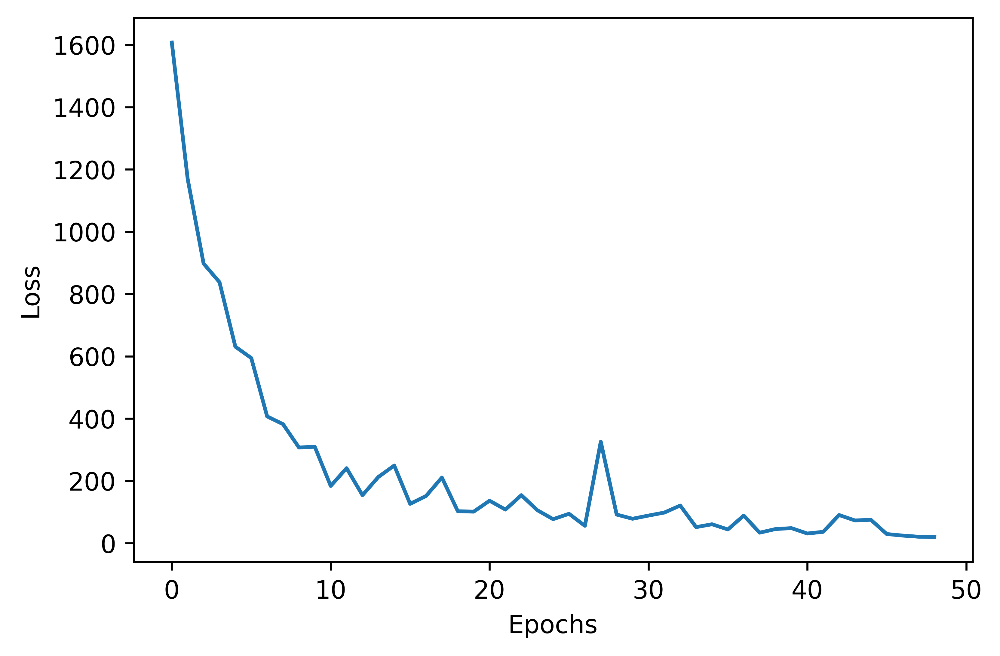

In [116]:
losss=np.array(loss_list)
#losss=np.log(losss)
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.plot(losss)
plt.show()

In [136]:
model.save(r'D:\Desktop\g_design\yolonew.h5', save_format="h5")


In [7]:
tflite=tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = tflite.convert()
m=open(r'D:\Desktop\g_design\yololitetest.tflite','wb')
m.write(tflite_model)
m.close()

### 模型测试

In [8]:
STARTN_T=100
NUMBER_T=100
tx_batch=[]
ty_batch=[]
anno_file=open(ANNO_DIR+ANNO_FILE,'r')
number=anno_file.readline()
classes=anno_file.readline()
print(number,classes)
if(NUMBER_T>int(number)):
    NUMBER_T=int(number)

for i in range(0,STARTN_T):
    anno_file.readline()
for i in range(0,NUMBER_T):
    ori=anno_file.readline()
    filename,x1,y1,w,h=ori.split(' ')
    #gen x batch
    img=cv2.imread(IMG_DIR+filename)
    height, width = img.shape[:2]
    
    img=cv2.resize(img, (INPUT_W, INPUT_H),)
    b,g,r = cv2.split(img)
    img = cv2.merge([r,g,b])
    tx_batch.append(img)
    
    
    #gen y batch
    yb=np.zeros((7,10,5))
    x1,y1,w,h=int(x1),int(y1),int(w),int(h)
    #print(filename,x1,y1,w,h,width,height)
    
    x=x1/width*320
    y=y1/height*240
    w=w/width*320
    h=h/height*240
    
    ty_batch.append([x,y,w,h])
    #test
    
    #print(filename,x,y,w,h,width,height)
    #cv2.rectangle(img,(int(x*320/10),int(y*height/7)),(int(x*width/10)+int(w*width),int(y*height/7)+int(h*height)),(255,0,0),2)
    #cv2.rectangle(img,(0,0),(100,100),(255,0,0),2)
    #plt.imshow(img)
    #plt.show()
    
ty_batch=np.array(ty_batch)
tx_batch=np.array(tx_batch)
print(tx_batch.shape,ty_batch.shape)
anno_file.close()

202599
 image_id x_1 y_1 width height

(100, 240, 320, 3) (100, 4)


In [9]:
test=model.predict(tx_batch)

In [16]:
def cal_iou(x1,y1,w1,h1,x2,y2,w2,h2):
    u=w1*h1+w2*h2
    xo=max(x1,x2)
    yo=max(y1,y2)
    
    wo=min(x1+w1,x2+w2)-xo
    ho=min(y1+h1,y2+w2)-yo
    
    i=wo*ho
    u=u-i
    
    return i/u
    
    

In [15]:
def do_nms(boxs):
    fina=[]
    ori=boxs[0]
    for box in boxs[1:]:
        if(cacl_iou()<thrhold):
            fina.append(box)
    return fina

### 结果显示

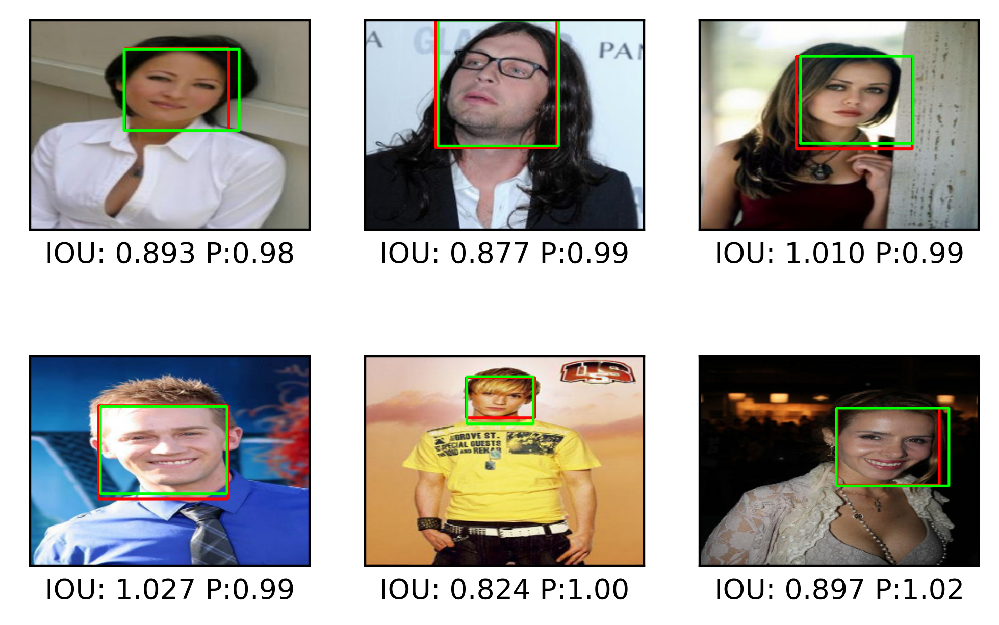

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


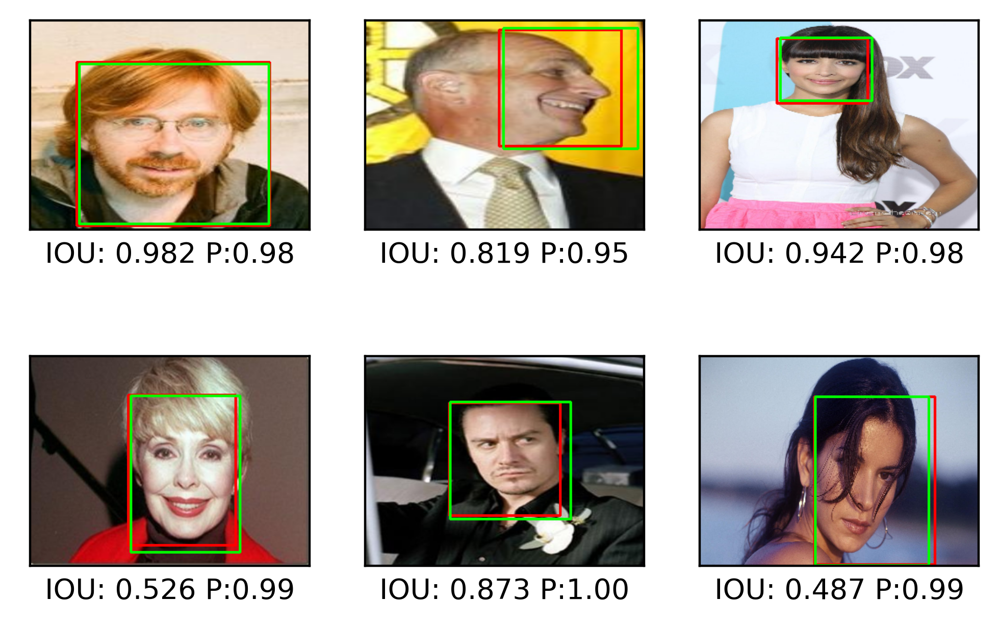

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


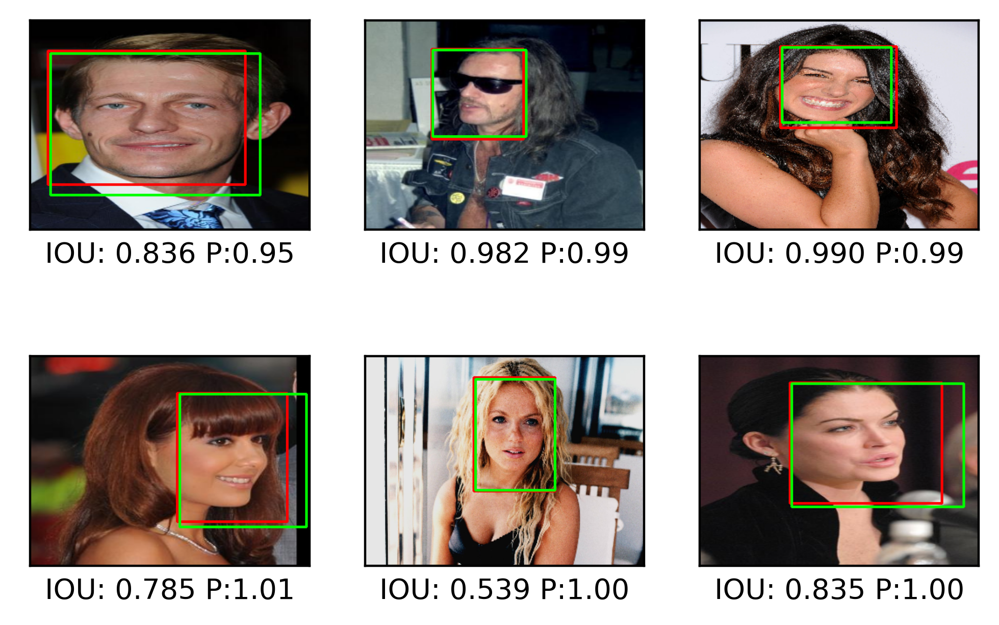

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


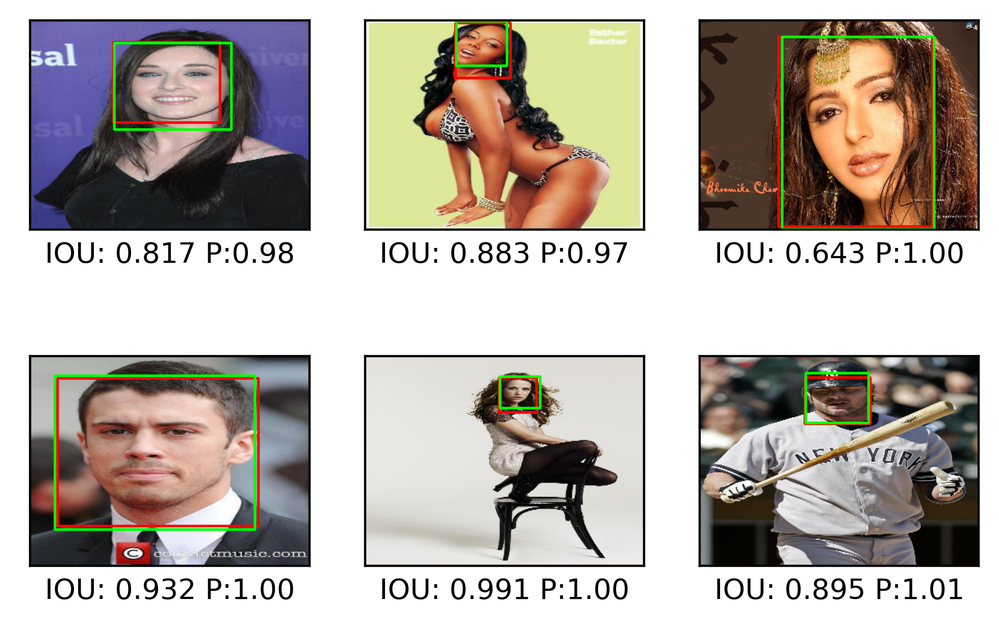

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


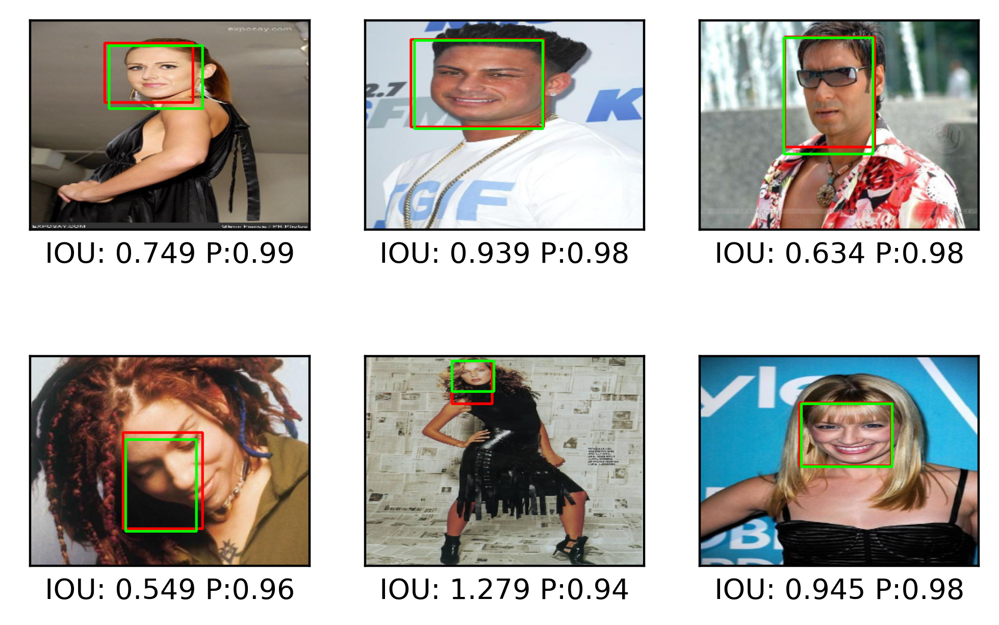

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


aver iou 0.8567211782586674


In [17]:
HOLD=0.9
green=(0,255,0)
red=(255,0,0)
i=0
ious=0
plt.rcParams['figure.dpi'] = 400
imgs=tx_batch[:]
for pred,img,real in zip(test,imgs,ty_batch):
    for y in range(0,7):
        for x in range(0,10):
            if(pred[y][x][0]>HOLD):
                
                if(i>5):
                    i=0
                    plt.show()
                plt.subplot(2,3,i+1)
                i+=1
                
                #print(x,y,pred[y][x])
                bx1=int(pred[y][x][1]*320/10)
                by1=int(pred[y][x][2]*240/7)
                bx2=int(pred[y][x][3]*320)
                by2=int(pred[y][x][4]*240)
                #print(bx1,by1,bx2,by2)
                cv2.rectangle(img,(bx1,by1),(bx1+bx2,by1+by2),red,2)
                #print(real)
                real=real.astype('int32')
                cv2.rectangle(img,(real[0],real[1]),(real[0]+real[2],real[1]+real[3]),green,2)#真实边界盒
                
                iou=cal_iou(bx1,by1,bx2,by2,real[0],real[1],real[2],real[3])#预测边界盒
                ious+=iou*0.01
                plt.xticks([])
                plt.yticks([])
                plt.xlabel('IOU: %.3f P:%.2f'%(iou,pred[y][x][0]))
                plt.imshow(img)
print("aver iou",ious)

### 摄像头测试

In [ ]:
capture = cv2.VideoCapture(0)
ret, frame = capture.read()
img=cv2.resize(frame, (320, 240),)
b,g,r = cv2.split(img)
img = cv2.merge([r,g,b])
img = np.array([img])

pred = model.predict(img)[0]
plt.rcParams['figure.dpi'] = 600
for y in range(0,7):
        for x in range(0,10):
            if(pred[y][x][0]>0.7):
                print(x,y,pred[y][x])
                bx1=int(pred[y][x][1]*320/10)
                by1=int(pred[y][x][2]*240/7)
                bx2=int(pred[y][x][3]*320)
                by2=int(pred[y][x][4]*240)
                print(bx1,by1,bx2,by2)
                cv2.rectangle(img[0],(bx1,by1),(bx1+bx2,by1+by2),green,2)
                #plt.imshow(img)
                #plt.show()
plt.imshow(img[0])
plt.show()
capture.release()

### 静态图片测试

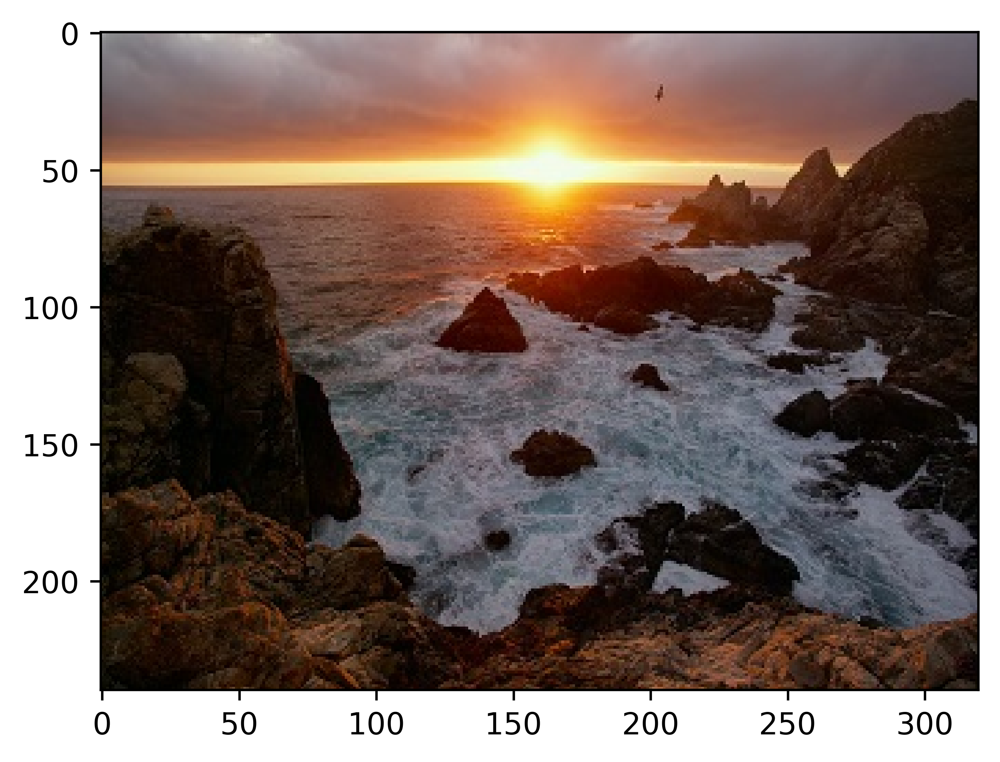

In [24]:
img = cv2.imread(TEST_DIR+'1.jpg')
img=cv2.resize(img, (320, 240),)
b,g,r = cv2.split(img)
img = cv2.merge([r,g,b])
img = np.array([img])

pred = model.predict(img)[0]
plt.rcParams['figure.dpi'] = 600
for y in range(0,7):
        for x in range(0,10):
            if(pred[y][x][0]>0.8):
                print(x,y,pred[y][x])
                bx1=int(pred[y][x][1]*320/10)
                by1=int(pred[y][x][2]*240/7)
                bx2=int(pred[y][x][3]*320)
                by2=int(pred[y][x][4]*240)
                print(bx1,by1,bx2,by2)
                cv2.rectangle(img[0],(bx1,by1),(bx1+bx2,by1+by2),green,2)
                #plt.imshow(img)
                #plt.show()
plt.imshow(img[0])
plt.show()
